# Importing Useful Libraries

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.3.0


In [3]:
# Globals
dim = 50   # dimensions
epochs = 100
batch_size = 100
steps = 5
noise_size = dim

# Download and Unzip dataset

In [4]:
import glob
#files = glob.glob('./content/100k/100k/*.jpg')
files = glob.glob('./content/100k/img_align_celeba/*.jpg')
files = files[:10000]
len(files)

10000

# Data Preparation and Normalization

In [5]:
import tqdm
from tqdm import notebook

images = []
for file in tqdm.notebook.tqdm(files):
    celeb_img = cv2.imread(file)
    celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
    celeb_img = cv2.resize(celeb_img, (100, 100))
    images.append((celeb_img-127.5)/127.5)

images = np.array(images)
print (images.shape)

  0%|          | 0/10000 [00:00<?, ?it/s]

(10000, 100, 100, 3)


# Define Generator Model

In [6]:
random_input = tensorflow.keras.layers.Input(shape = dim)

x = tensorflow.keras.layers.Dense(64 * 7 * 7)(random_input)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Reshape((7, 7, 64))(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)

x = tensorflow.keras.layers.Conv2D(filters=3, kernel_size=(3,3), padding='same')(x)
generated_image = tensorflow.keras.layers.Activation('tanh')(x)

generator_network = tensorflow.keras.models.Model(inputs=random_input, outputs=generated_image)
generator_network.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 50)]              0         
_________________________________________________________________
dense (Dense)                (None, 3136)              159936    
_________________________________________________________________
activation (Activation)      (None, 3136)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 3136)              12544     
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 128)       204928    
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 128)      

# Define Discriminator

In [7]:
image_input = tensorflow.keras.layers.Input(shape=(56, 56, 3))

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(image_input)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Flatten()(x)

x = tensorflow.keras.layers.Dense(1)(x)
real_vs_fake_output = tensorflow.keras.layers.Activation('sigmoid')(x)

discriminator_network = tensorflow.keras.models.Model(inputs=image_input, outputs=real_vs_fake_output)
discriminator_network.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 56, 56, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 128)       9728      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 28, 28, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        204864    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 128)        

In [8]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network.compile(loss='binary_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

# Define combined model: DCGAN

In [9]:
discriminator_network.trainable=False

g_output = generator_network(random_input)
d_output = discriminator_network(g_output)

dcgan_model = tensorflow.keras.models.Model(random_input, d_output)
dcgan_model.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 50)]              0         
_________________________________________________________________
functional_1 (Functional)    (None, 56, 56, 3)         1611587   
_________________________________________________________________
functional_3 (Functional)    (None, 1)                 904961    
Total params: 2,516,548
Trainable params: 1,604,547
Non-trainable params: 912,001
_________________________________________________________________


# Compiling Models

In [10]:
dcgan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer)

# Define Data Generators

In [11]:
def get_random_noise(batch_size, noise_size):
    random_values = np.random.randn(batch_size*noise_size)
    random_noise_batch = np.reshape(random_values, (batch_size, noise_size))
    return random_noise_batch

def get_fake_samples(generator_network, batch_size, noise_size):
    random_noise_batch = get_random_noise(batch_size, noise_size) 
    fake_samples = generator_network.predict_on_batch(random_noise_batch)
    return fake_samples

def get_real_samples(batch_size):
    random_files = np.random.choice(files, size=batch_size)
    images = []
    for file in random_files:
        celeb_img = cv2.imread(file)
        celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
        celeb_img = cv2.resize(celeb_img, (56, 56))
        images.append((celeb_img-127.5)/127.5)
    real_images = np.array(images)
    return real_images

def show_generator_results(generator_network):
    for k in range(9):
        plt.figure(figsize=(11, 11))
        fake_samples = get_fake_samples(generator_network, 9, noise_size)
        fake_samples = (fake_samples+1.0)/2.0
        for j in range(9):
            plt.subplot(990 + 1 + j)
            plt.imshow(fake_samples[j])
            plt.axis('off')
            #plt.title(trainY[i])
        plt.show()
    return

# Training DCGAN on Celeb Faces

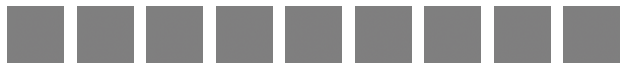

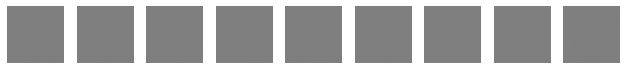

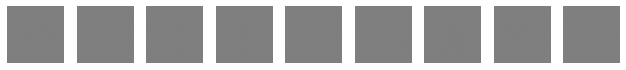

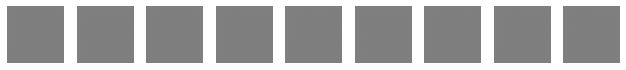

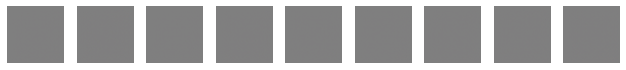

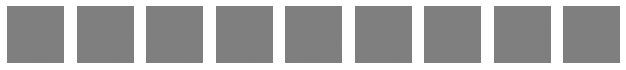

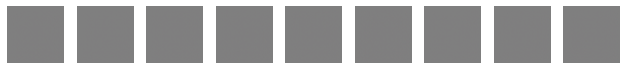

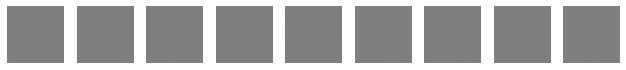

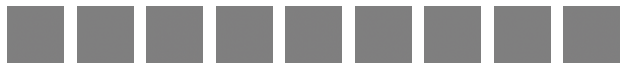

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./content/celeb_model_0\assets
Epoch:0, Step:0, D-Loss:1.028, D-Acc:22.000, G-Loss:0.653
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:1, Step:0, D-Loss:0.031, D-Acc:99.000, G-Loss:0.608
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:2, Step:0, D-Loss:0.008, D-Acc:100.000, G-Loss:0.198
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:3, Step:0, D-Loss:0.006, D-Acc:100.000, G-Loss:0.006
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:4, Step:0, D-Loss:0.006, D-Acc:100.000, G-Loss:0.013
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


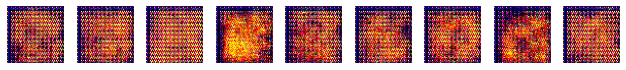

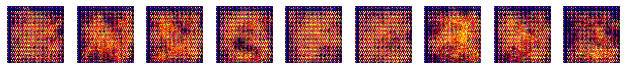

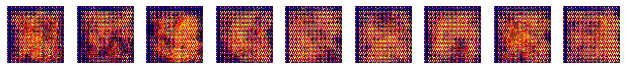

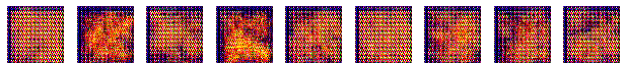

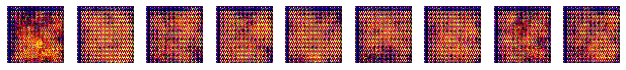

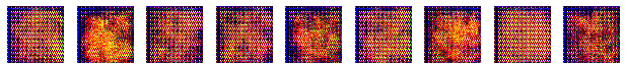

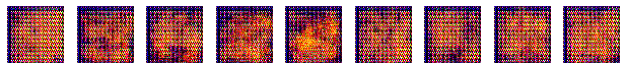

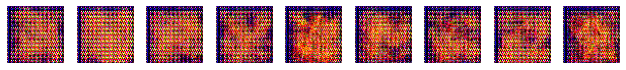

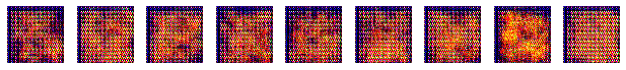

INFO:tensorflow:Assets written to: ./content/celeb_model_5\assets
Epoch:5, Step:0, D-Loss:0.024, D-Acc:100.000, G-Loss:4.034
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:6, Step:0, D-Loss:0.013, D-Acc:100.000, G-Loss:9.726
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:7, Step:0, D-Loss:0.008, D-Acc:100.000, G-Loss:15.076
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:8, Step:0, D-Loss:0.139, D-Acc:96.000, G-Loss:18.111
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:9, Step:0, D-Loss:0.156, D-Acc:91.000, G-Loss:19.383
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


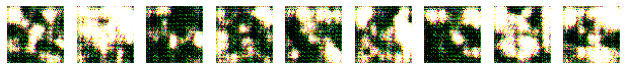

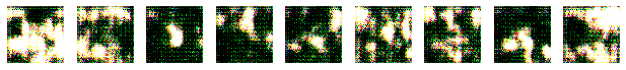

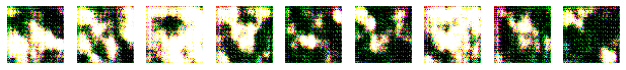

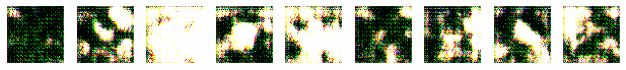

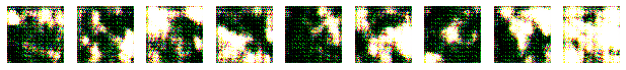

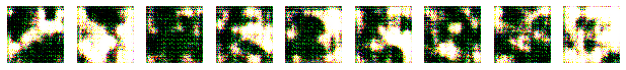

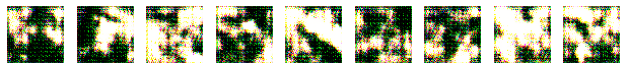

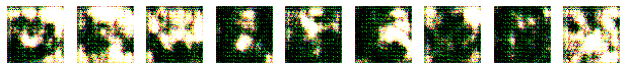

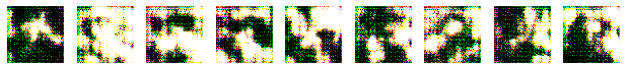

INFO:tensorflow:Assets written to: ./content/celeb_model_10\assets
Epoch:10, Step:0, D-Loss:0.056, D-Acc:98.000, G-Loss:8.901
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:11, Step:0, D-Loss:0.040, D-Acc:98.000, G-Loss:13.078
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:12, Step:0, D-Loss:0.008, D-Acc:100.000, G-Loss:11.246
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:13, Step:0, D-Loss:0.018, D-Acc:99.000, G-Loss:8.216
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:14, Step:0, D-Loss:0.030, D-Acc:99.000, G-Loss:5.092
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


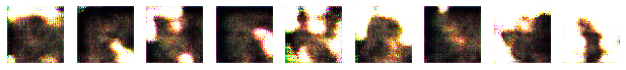

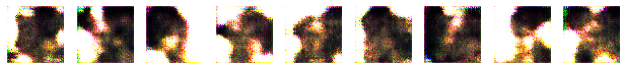

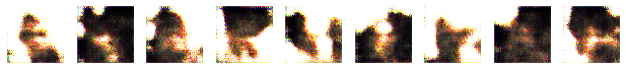

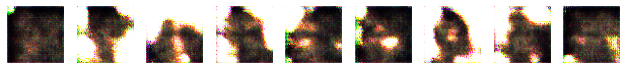

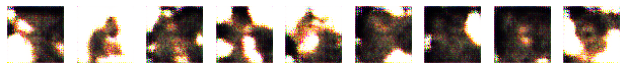

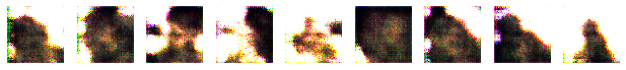

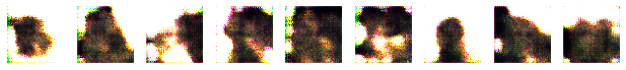

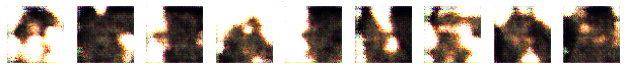

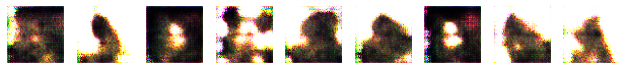

INFO:tensorflow:Assets written to: ./content/celeb_model_15\assets
Epoch:15, Step:0, D-Loss:0.175, D-Acc:94.000, G-Loss:3.563
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:16, Step:0, D-Loss:0.234, D-Acc:91.000, G-Loss:5.158
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:17, Step:0, D-Loss:0.192, D-Acc:93.000, G-Loss:4.644
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:18, Step:0, D-Loss:0.186, D-Acc:97.000, G-Loss:5.040
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:19, Step:0, D-Loss:0.222, D-Acc:93.000, G-Loss:4.639
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


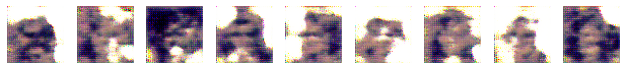

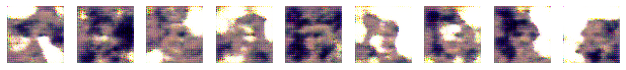

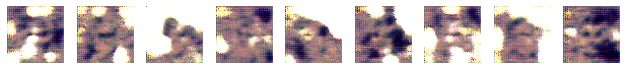

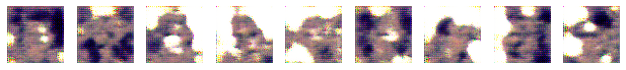

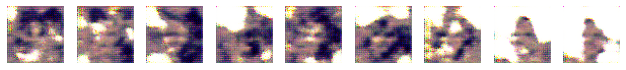

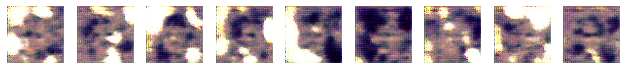

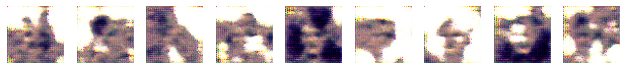

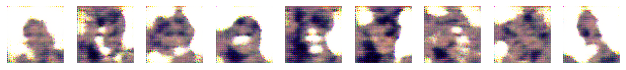

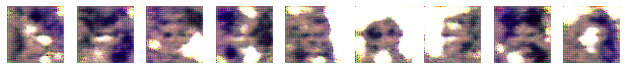

INFO:tensorflow:Assets written to: ./content/celeb_model_20\assets
Epoch:20, Step:0, D-Loss:0.476, D-Acc:83.000, G-Loss:4.774
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:21, Step:0, D-Loss:0.161, D-Acc:93.000, G-Loss:3.682
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:22, Step:0, D-Loss:0.484, D-Acc:79.000, G-Loss:5.689
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:23, Step:0, D-Loss:0.359, D-Acc:86.000, G-Loss:3.011
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:24, Step:0, D-Loss:0.245, D-Acc:90.000, G-Loss:3.546
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


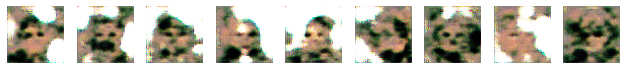

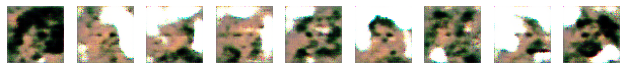

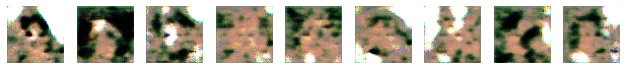

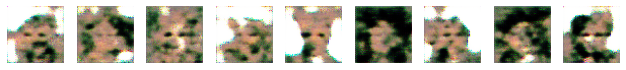

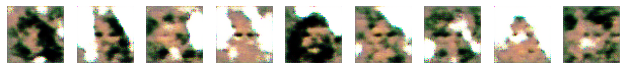

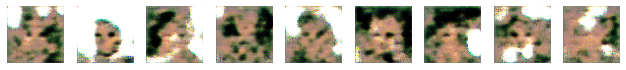

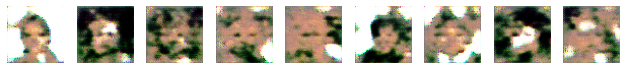

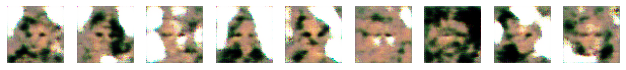

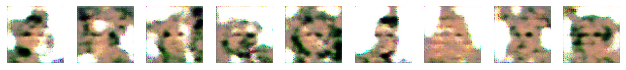

INFO:tensorflow:Assets written to: ./content/celeb_model_25\assets
Epoch:25, Step:0, D-Loss:0.315, D-Acc:89.000, G-Loss:3.764
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:26, Step:0, D-Loss:0.293, D-Acc:90.000, G-Loss:2.066
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:27, Step:0, D-Loss:0.344, D-Acc:85.000, G-Loss:4.319
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:28, Step:0, D-Loss:0.201, D-Acc:94.000, G-Loss:1.346
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:29, Step:0, D-Loss:0.281, D-Acc:90.000, G-Loss:4.614
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


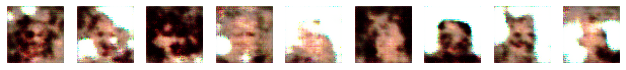

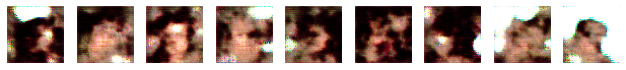

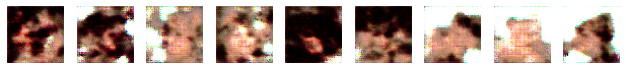

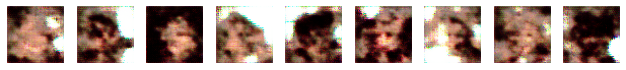

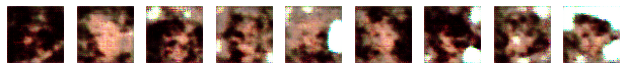

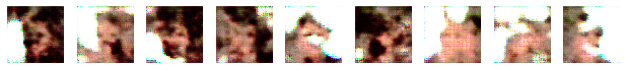

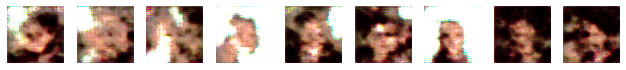

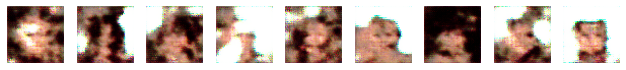

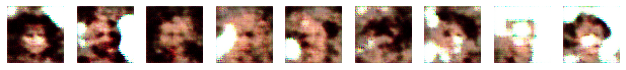

INFO:tensorflow:Assets written to: ./content/celeb_model_30\assets
Epoch:30, Step:0, D-Loss:0.424, D-Acc:82.000, G-Loss:0.862
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:31, Step:0, D-Loss:0.263, D-Acc:88.000, G-Loss:3.414
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:32, Step:0, D-Loss:0.363, D-Acc:87.000, G-Loss:2.662
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:33, Step:0, D-Loss:0.213, D-Acc:90.000, G-Loss:4.269
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:34, Step:0, D-Loss:0.354, D-Acc:88.000, G-Loss:1.570
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


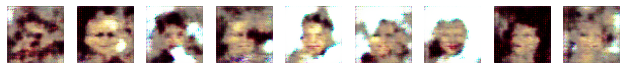

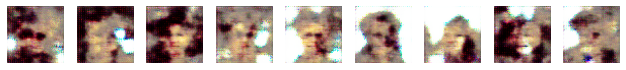

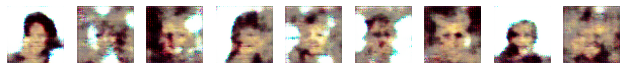

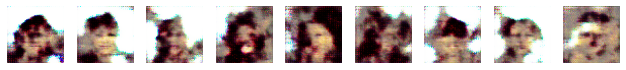

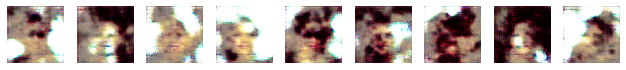

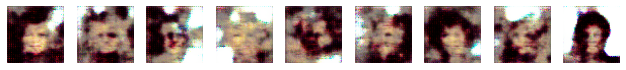

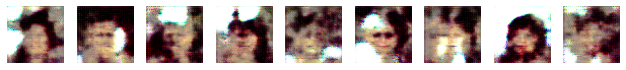

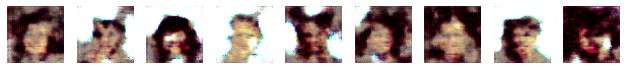

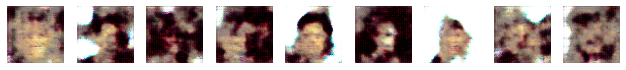

INFO:tensorflow:Assets written to: ./content/celeb_model_35\assets
Epoch:35, Step:0, D-Loss:0.314, D-Acc:87.000, G-Loss:1.373
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:36, Step:0, D-Loss:0.252, D-Acc:91.000, G-Loss:4.098
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:37, Step:0, D-Loss:0.306, D-Acc:86.000, G-Loss:5.192
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:38, Step:0, D-Loss:0.469, D-Acc:80.000, G-Loss:2.726
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:39, Step:0, D-Loss:0.247, D-Acc:90.000, G-Loss:2.062
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


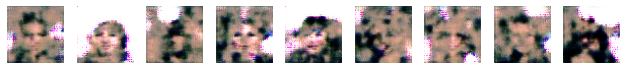

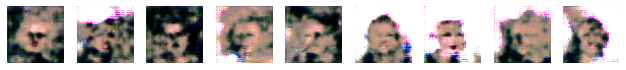

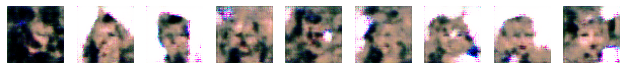

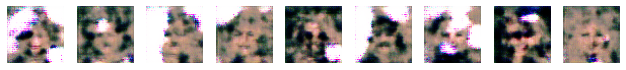

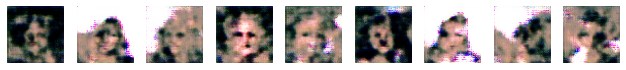

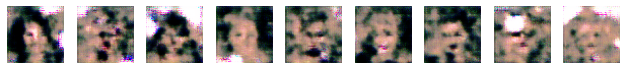

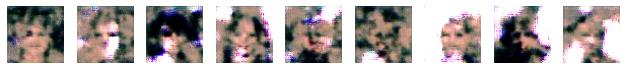

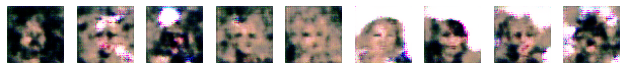

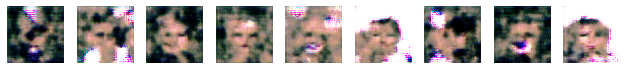

INFO:tensorflow:Assets written to: ./content/celeb_model_40\assets
Epoch:40, Step:0, D-Loss:0.286, D-Acc:87.000, G-Loss:1.794
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:41, Step:0, D-Loss:0.223, D-Acc:90.000, G-Loss:6.750
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:42, Step:0, D-Loss:0.278, D-Acc:89.000, G-Loss:4.522
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:43, Step:0, D-Loss:0.281, D-Acc:92.000, G-Loss:3.554
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:44, Step:0, D-Loss:0.308, D-Acc:89.000, G-Loss:0.690
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


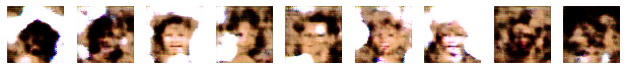

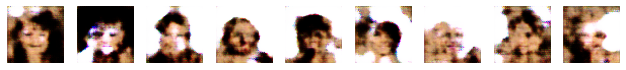

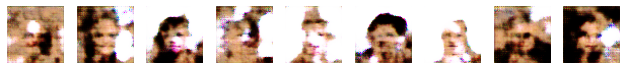

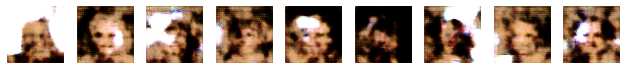

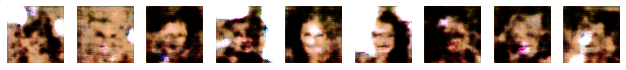

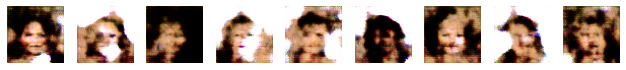

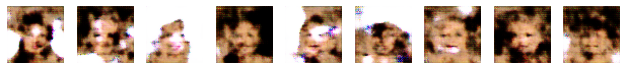

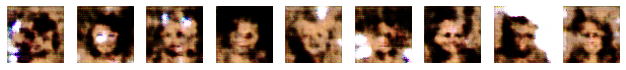

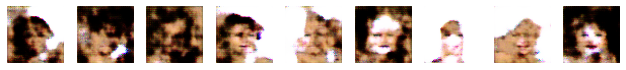

INFO:tensorflow:Assets written to: ./content/celeb_model_45\assets
Epoch:45, Step:0, D-Loss:0.216, D-Acc:90.000, G-Loss:4.252
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:46, Step:0, D-Loss:0.384, D-Acc:82.000, G-Loss:2.658
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:47, Step:0, D-Loss:0.516, D-Acc:73.000, G-Loss:1.055
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:48, Step:0, D-Loss:0.233, D-Acc:93.000, G-Loss:7.312
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:49, Step:0, D-Loss:0.366, D-Acc:85.000, G-Loss:1.718
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


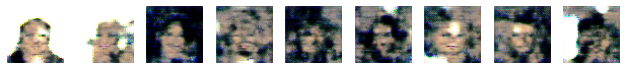

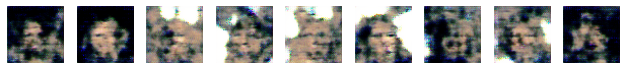

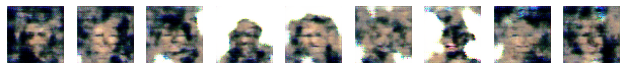

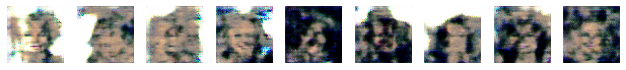

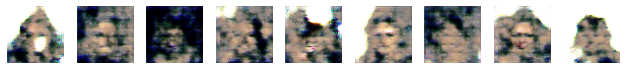

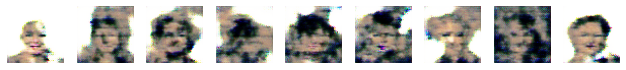

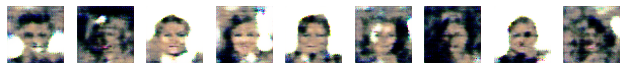

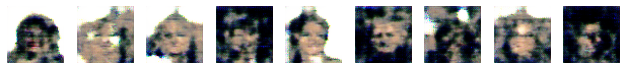

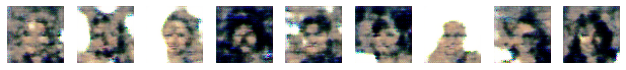

INFO:tensorflow:Assets written to: ./content/celeb_model_50\assets
Epoch:50, Step:0, D-Loss:0.211, D-Acc:92.000, G-Loss:1.489
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:51, Step:0, D-Loss:0.174, D-Acc:95.000, G-Loss:3.467
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:52, Step:0, D-Loss:0.404, D-Acc:80.000, G-Loss:3.361
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:53, Step:0, D-Loss:0.295, D-Acc:88.000, G-Loss:2.230
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:54, Step:0, D-Loss:0.293, D-Acc:87.000, G-Loss:1.567
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


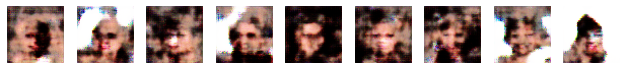

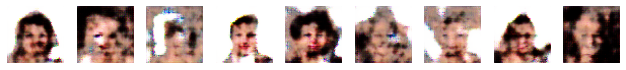

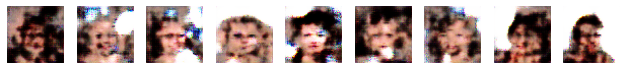

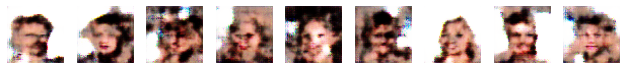

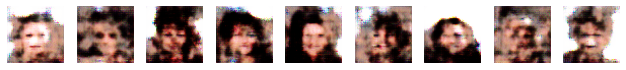

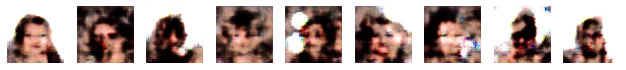

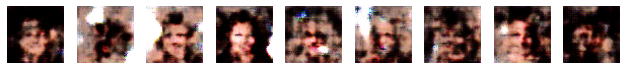

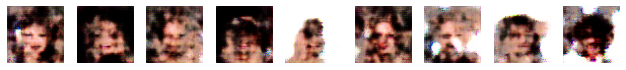

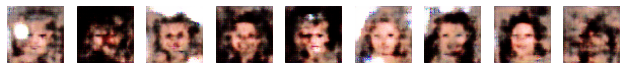

INFO:tensorflow:Assets written to: ./content/celeb_model_55\assets
Epoch:55, Step:0, D-Loss:0.269, D-Acc:89.000, G-Loss:3.099
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:56, Step:0, D-Loss:0.354, D-Acc:84.000, G-Loss:2.588
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:57, Step:0, D-Loss:0.230, D-Acc:94.000, G-Loss:1.384
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:58, Step:0, D-Loss:0.317, D-Acc:88.000, G-Loss:5.587
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:59, Step:0, D-Loss:0.185, D-Acc:94.000, G-Loss:4.899
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


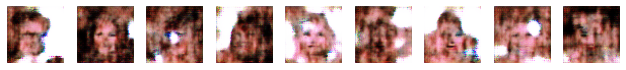

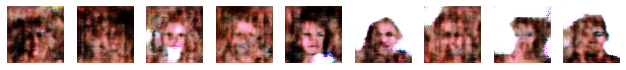

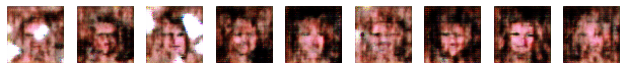

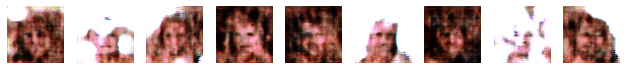

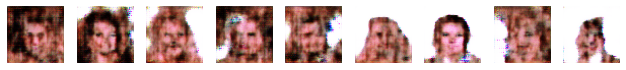

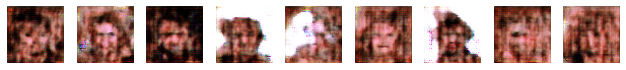

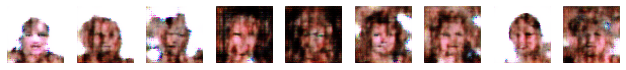

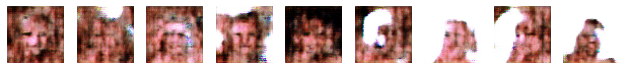

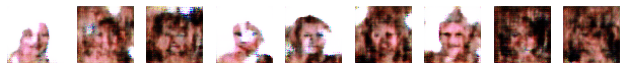

INFO:tensorflow:Assets written to: ./content/celeb_model_60\assets
Epoch:60, Step:0, D-Loss:0.265, D-Acc:89.000, G-Loss:4.076
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:61, Step:0, D-Loss:0.338, D-Acc:86.000, G-Loss:1.993
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:62, Step:0, D-Loss:0.246, D-Acc:90.000, G-Loss:1.369
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:63, Step:0, D-Loss:0.240, D-Acc:90.000, G-Loss:4.733
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:64, Step:0, D-Loss:0.262, D-Acc:91.000, G-Loss:2.999
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


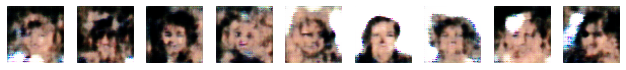

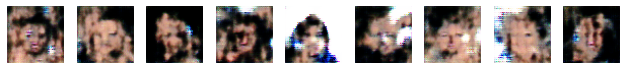

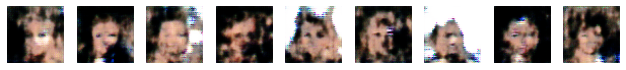

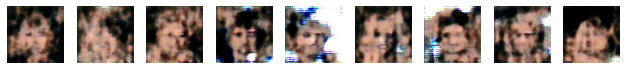

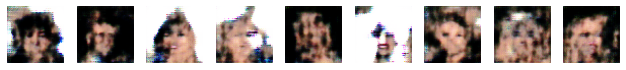

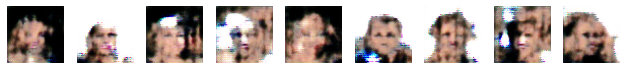

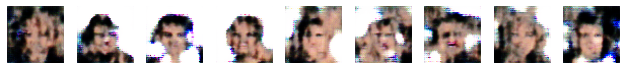

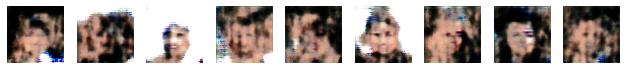

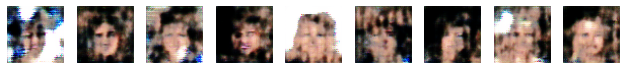

INFO:tensorflow:Assets written to: ./content/celeb_model_65\assets
Epoch:65, Step:0, D-Loss:0.310, D-Acc:87.000, G-Loss:2.214
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:66, Step:0, D-Loss:0.224, D-Acc:93.000, G-Loss:2.836
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:67, Step:0, D-Loss:0.433, D-Acc:84.000, G-Loss:3.016
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:68, Step:0, D-Loss:0.432, D-Acc:85.000, G-Loss:2.765
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:69, Step:0, D-Loss:0.178, D-Acc:91.000, G-Loss:4.018
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


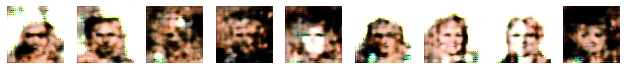

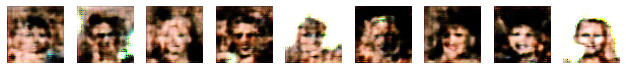

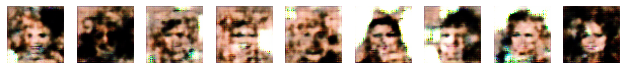

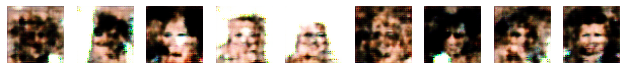

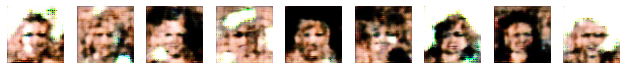

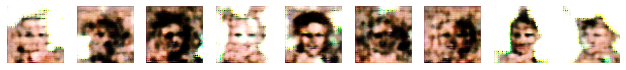

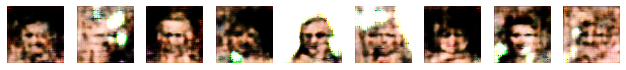

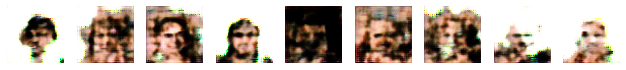

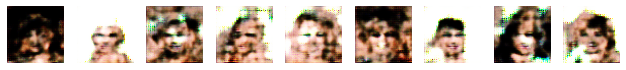

INFO:tensorflow:Assets written to: ./content/celeb_model_70\assets
Epoch:70, Step:0, D-Loss:0.245, D-Acc:94.000, G-Loss:4.488
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:71, Step:0, D-Loss:0.332, D-Acc:87.000, G-Loss:2.762
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:72, Step:0, D-Loss:0.278, D-Acc:87.000, G-Loss:1.210
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:73, Step:0, D-Loss:0.271, D-Acc:88.000, G-Loss:3.749
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:74, Step:0, D-Loss:0.284, D-Acc:89.000, G-Loss:6.777
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


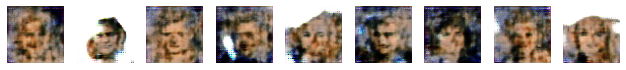

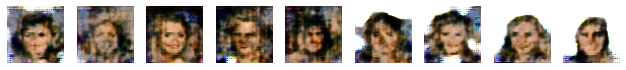

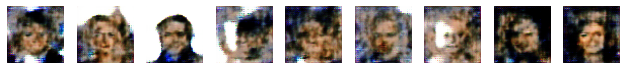

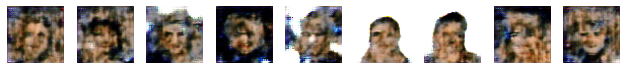

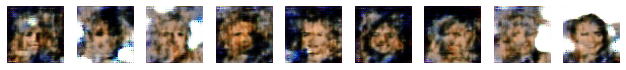

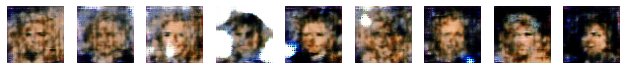

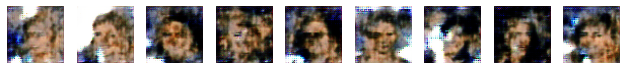

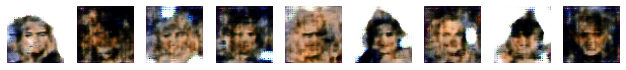

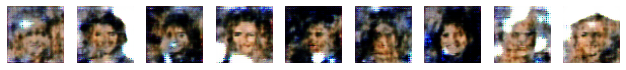

INFO:tensorflow:Assets written to: ./content/celeb_model_75\assets
Epoch:75, Step:0, D-Loss:0.379, D-Acc:79.000, G-Loss:2.742
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:76, Step:0, D-Loss:0.368, D-Acc:83.000, G-Loss:1.922
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:77, Step:0, D-Loss:0.256, D-Acc:88.000, G-Loss:1.346
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:78, Step:0, D-Loss:0.180, D-Acc:94.000, G-Loss:2.163
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:79, Step:0, D-Loss:0.421, D-Acc:83.000, G-Loss:1.192
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


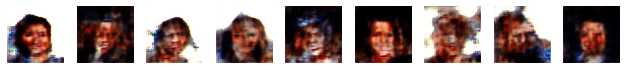

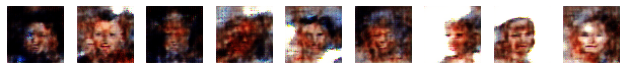

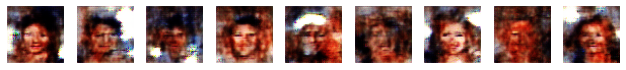

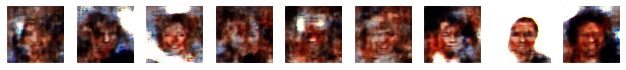

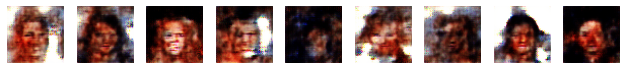

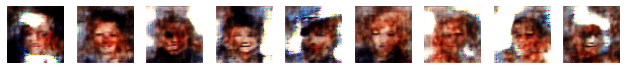

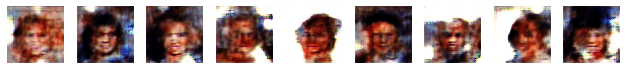

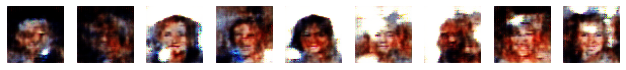

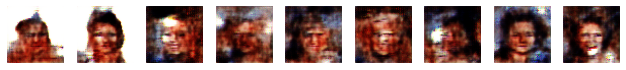

INFO:tensorflow:Assets written to: ./content/celeb_model_80\assets
Epoch:80, Step:0, D-Loss:0.212, D-Acc:91.000, G-Loss:4.569
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:81, Step:0, D-Loss:0.464, D-Acc:84.000, G-Loss:2.204
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:82, Step:0, D-Loss:0.323, D-Acc:84.000, G-Loss:0.765
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:83, Step:0, D-Loss:0.321, D-Acc:88.000, G-Loss:6.090
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:84, Step:0, D-Loss:0.324, D-Acc:85.000, G-Loss:3.240
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


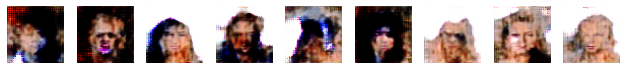

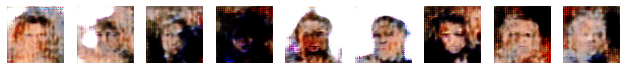

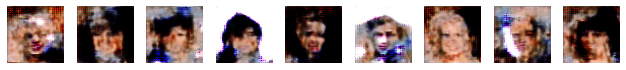

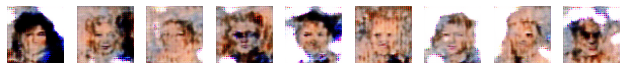

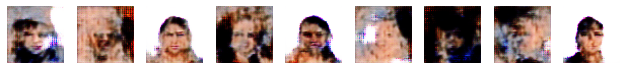

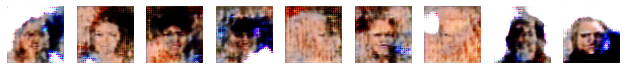

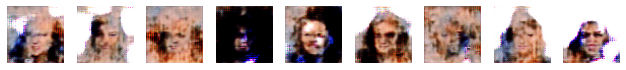

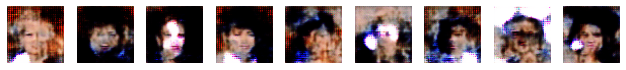

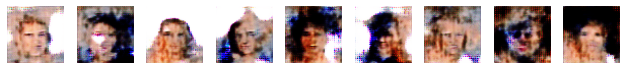

INFO:tensorflow:Assets written to: ./content/celeb_model_85\assets
Epoch:85, Step:0, D-Loss:0.382, D-Acc:81.000, G-Loss:3.347
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:86, Step:0, D-Loss:0.165, D-Acc:93.000, G-Loss:2.249
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:87, Step:0, D-Loss:0.340, D-Acc:88.000, G-Loss:4.703
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:88, Step:0, D-Loss:0.312, D-Acc:89.000, G-Loss:2.417
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:89, Step:0, D-Loss:0.516, D-Acc:77.000, G-Loss:2.055
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


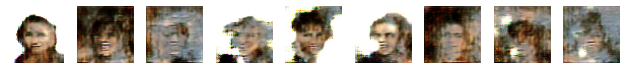

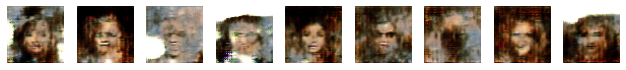

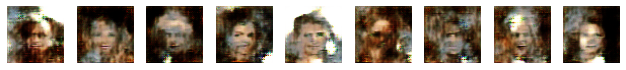

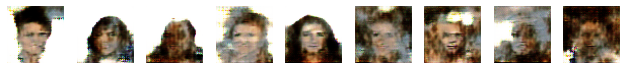

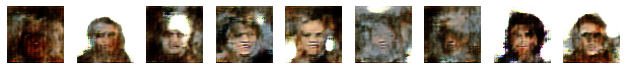

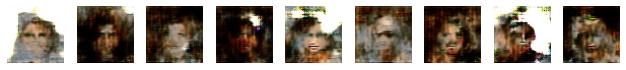

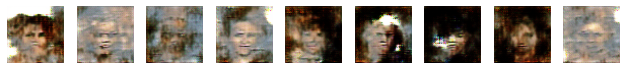

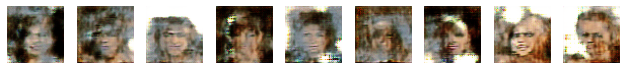

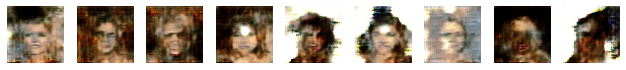

INFO:tensorflow:Assets written to: ./content/celeb_model_90\assets
Epoch:90, Step:0, D-Loss:0.355, D-Acc:85.000, G-Loss:1.828
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:91, Step:0, D-Loss:0.349, D-Acc:86.000, G-Loss:2.719
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:92, Step:0, D-Loss:0.305, D-Acc:89.000, G-Loss:3.680
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:93, Step:0, D-Loss:0.319, D-Acc:86.000, G-Loss:4.579
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:94, Step:0, D-Loss:0.392, D-Acc:82.000, G-Loss:0.797
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


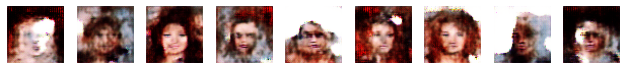

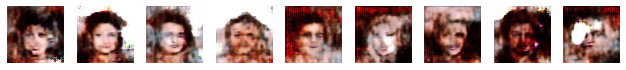

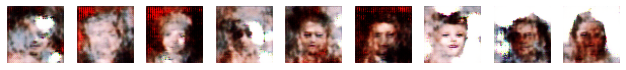

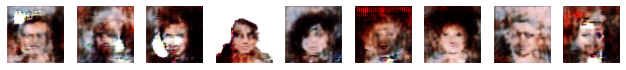

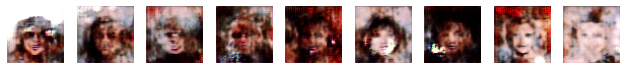

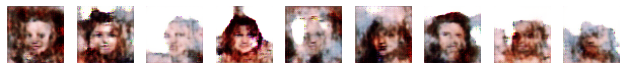

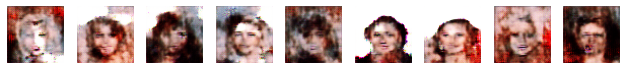

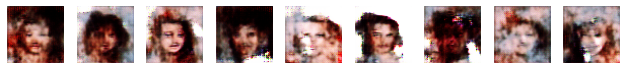

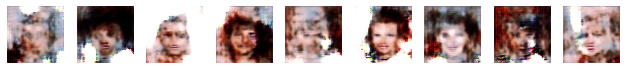

INFO:tensorflow:Assets written to: ./content/celeb_model_95\assets
Epoch:95, Step:0, D-Loss:0.243, D-Acc:91.000, G-Loss:2.321
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:96, Step:0, D-Loss:0.456, D-Acc:79.000, G-Loss:1.374
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:97, Step:0, D-Loss:0.318, D-Acc:89.000, G-Loss:3.281
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:98, Step:0, D-Loss:0.222, D-Acc:91.000, G-Loss:4.573
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets
Epoch:99, Step:0, D-Loss:0.447, D-Acc:80.000, G-Loss:2.717
INFO:tensorflow:Assets written to: ./content/celeb_model_new\assets


In [12]:
#epochs = 2
#batch_size = 10
#steps = 5
#noise_size = dim

for i in range(0, epochs):
    if (i%5 == 0):
        show_generator_results(generator_network)
        generator_network.save('./content/celeb_model_'+ str(i))
    for j in range(steps):
        fake_samples = get_fake_samples(generator_network, batch_size//2, noise_size)
        real_samples = get_real_samples(batch_size=batch_size//2)

        fake_y = np.zeros((batch_size//2, 1))
        real_y = np.ones((batch_size//2, 1))
        
        input_batch = np.vstack((fake_samples, real_samples))
        output_labels = np.vstack((fake_y, real_y))
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d = discriminator_network.train_on_batch(input_batch, output_labels)
        
        gan_input = get_random_noise(batch_size, noise_size)
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        gan_output = np.ones((batch_size))
        
        # Updating Generator weights
        discriminator_network.trainable=False
        loss_g = dcgan_model.train_on_batch(gan_input, gan_output)
        
        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g))
    generator_network.save('./content/celeb_model_new')
            

# Show Results

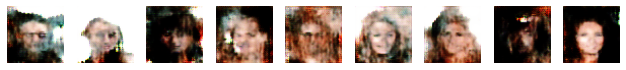

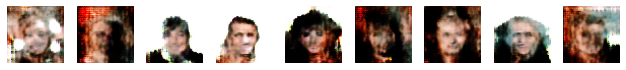

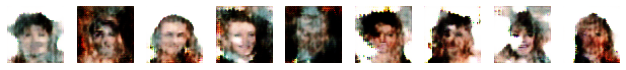

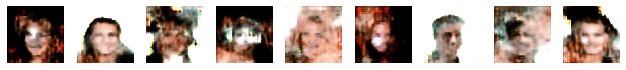

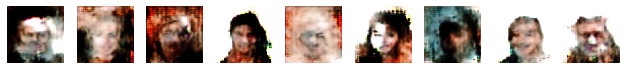

...

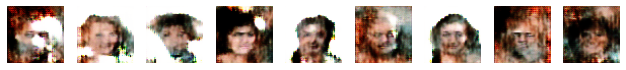

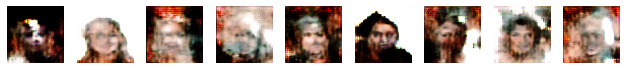

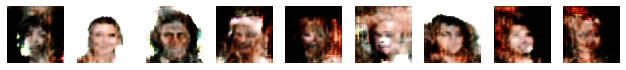

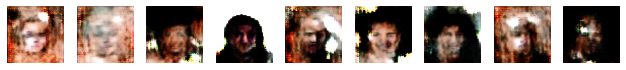

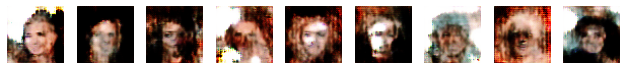

In [13]:
#Generating Unlimited samples
noise_size=dim
generator_network = tensorflow.keras.models.load_model('./content/celeb_model_new')
for i in range(5):
    show_generator_results(generator_network)